In [1]:
import math
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras import layers, Model
from keras.layers import Conv2D, PReLU, BatchNormalization, Flatten, Dense
from keras.layers import LeakyReLU, UpSampling2D, add, Input
from sklearn.model_selection import train_test_split
from keras.applications import VGG19
from keras.models import load_model
import random
from tqdm import tqdm
from skimage.metrics import structural_similarity as ssim


Using TensorFlow backend.


In [2]:
def res_block(ip):
    res_layer = Conv2D(kernel_size=(3, 3), filters=64, padding="same", strides=1)(ip)
    res_layer = BatchNormalization(momentum=0.5)(res_layer)
    res_layer = PReLU(shared_axes=([1, 2]))(res_layer)

    res_layer = Conv2D(kernel_size=(3, 3), filters=64, padding="same", strides=1)(res_layer)
    res_layer = BatchNormalization(momentum=0.5)(res_layer)
    return add([ip, res_layer])

In [3]:
def up_scale_block(ip):
    up_block = Conv2D(filters=256, kernel_size=(3, 3), padding="same", strides=1)(ip)
    up_block = UpSampling2D(size=2)(up_block)
    up_block = PReLU(shared_axes=[1, 2])(up_block)

    return up_block

In [4]:
def gen_model(ip, num_of_resblock):
    layers = Conv2D(kernel_size=(9, 9), filters=64, padding="same", )(ip)
    layers = PReLU(shared_axes=[1, 2])(layers)

    temp = layers

    for i in range(num_of_resblock):
        layers = res_block(layers)

    layers = Conv2D(filters=64, kernel_size=(3, 3), padding="same", strides=1)(layers)
    layers = BatchNormalization(momentum=0.5)(layers)
    layers = add([layers, temp])
    layers = up_scale_block(layers)
    layers = up_scale_block(layers)
    op = Conv2D(kernel_size=(9, 9), filters=3, padding="same", strides=1)(layers)

    return Model(input=ip, outputs=op)

In [5]:
def discriminator_block(ip, filters, strides, bn=True):
    disc_model = Conv2D(filters=filters, kernel_size=(3, 3), padding="same", strides=strides)(ip)
    if bn:
        disc_model = BatchNormalization(momentum=0.5)(disc_model)
    disc_model = LeakyReLU(alpha=0.2)(disc_model)
    return disc_model


In [6]:
def create_dis(disc_ip):
    df = 64
    d1 = discriminator_block(disc_ip, df, 1, False)
    d2 = discriminator_block(d1, df, 2)
    d3 = discriminator_block(d2, df * 2, 1)
    d4 = discriminator_block(d3, df * 2, 2)
    d5 = discriminator_block(d4, df * 4, 1)
    d6 = discriminator_block(d5, df * 4, 2)
    d7 = discriminator_block(d6, df * 8, 1)
    d8 = discriminator_block(d7, df * 8, 2)
    d8_5 = Flatten()(d8)
    d9 = Dense(df * 16)(d8_5)
    d10 = LeakyReLU(alpha=0.2)(d9)
    validity = Dense(1, activation="sigmoid")(d10)
    return Model(disc_ip, validity)


In [7]:

def build_vgg(hr_shape):
    vgg = VGG19(weights="imagenet", include_top=False, input_shape=hr_shape)

    return Model(inputs=vgg.inputs, outputs=vgg.layers[10].output)


In [8]:
def comb_model(gen_model, disc_model, vgg, lr_ip, hr_ip):
    gen_img = gen_model(lr_ip)
    gen_features = vgg(gen_img)

    disc_model.trainable = False
    validity = disc_model(gen_img)
    return Model(inputs=[lr_ip, hr_ip], outputs=[validity, gen_features])

['.DS_Store', 'monarch.png', 'flowers.png', 'ppt3.png', 'zebra.png', 'bird.png', 'lenna.png', 'barbara.png', 'butterfly.png', 'face.png', 'comic.png', 'pepper.png', 'coastguard.png', 'head.png', 'foreman.png', 'woman.png', 'baby.png', 'baboon.png']
['.DS_Store', 'monarch.png', 'flowers.png', 'ppt3.png', 'zebra.png', 'bird.png', 'lenna.png', 'barbara.png', 'butterfly.png', 'face.png', 'comic.png', 'pepper.png', 'coastguard.png', 'head.png', 'foreman.png', 'woman.png', 'baby.png', 'baboon.png']


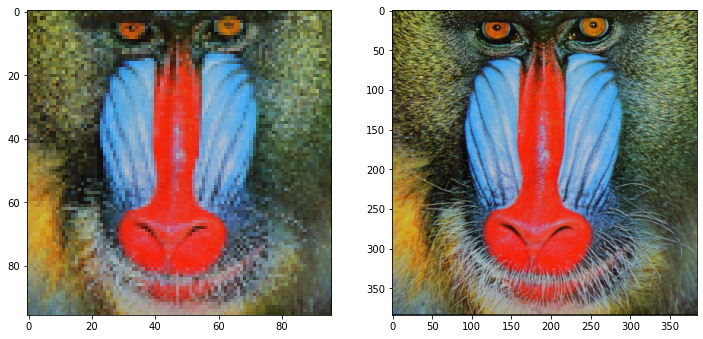

In [9]:
lr_list = os.listdir("lr_test")
lr_images = []
print(lr_list)
for img in lr_list[1:]:
    img_lr = cv2.imread("lr_test/" + img)
    img_lr = cv2.cvtColor(img_lr, cv2.COLOR_BGR2RGB)
    lr_images.append(img_lr)

hr_list = os.listdir("hr_test")
hr_images = []
print(hr_list)
for img in hr_list[1:]:
    img_hr = cv2.imread("hr_test/" + img)
    img_hr = cv2.cvtColor(img_hr, cv2.COLOR_BGR2RGB)
    hr_images.append(img_hr)

lr_images = np.array(lr_images)
hr_images = np.array(hr_images)
lr_images = np.array(lr_images)
hr_images = np.array(hr_images)

#Sanity check, view few mages
import random
import numpy as np
image_number = random.randint(0, len(lr_images)-1)
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(lr_images[image_number], (96, 96, 3)))
plt.subplot(122)
plt.imshow(np.reshape(hr_images[image_number], (384, 384, 3)))
plt.show()

#Scale values
lr_images = lr_images / 255.
hr_images = hr_images / 255.

In [10]:
def train():
    lr_train, hr_train = lr_images, hr_images

    hr_shape = (hr_train.shape[1], hr_train.shape[2], hr_train.shape[3])
    lr_shape = (lr_train.shape[1], lr_train.shape[2], lr_train.shape[3])

    lr_ip = Input(shape=lr_shape)
    hr_ip = Input(shape=hr_shape)

    generator = gen_model(lr_ip, num_of_resblock=16)
    generator.summary()

    discriminator = create_dis(hr_ip)
    discriminator.compile(loss="binary_crossentropy", optimizer="adam", metrics=['accuracy'])
    discriminator.summary()

    vgg = build_vgg((128, 128, 3))
    print(vgg.summary())
    vgg.trainable = False

    gan_model = comb_model(generator, discriminator, vgg, lr_ip, hr_ip)

    
    gan_model.compile(loss=["binary_crossentropy", "mse"], loss_weights=[1e-3, 1], optimizer="adam")
    gan_model.summary()

    # Create a list of images for LR and HR in batches from which a batch of images
    # would be fetched during training.

    batch_size = 1
    train_lr_batches = []
    train_hr_batches = []
    for it in range(int(hr_train.shape[0] / batch_size)):
        start_idx = it * batch_size
        end_idx = start_idx + batch_size
        train_hr_batches.append(hr_train[start_idx:end_idx])
        train_lr_batches.append(lr_train[start_idx:end_idx])

    epochs = 25
    # Enumerate training over epochs
    for e in range(6, epochs):

        fake_label = np.zeros((batch_size, 1))  # Assign a label of 0 to all fake (generated images)
        real_label = np.ones((batch_size, 1))  # Assign a label of 1 to all real images.

        # Create empty lists to populate gen and disc losses.
        g_losses = []
        d_losses = []

        # Enumerate training over batches.
        for b in tqdm(range(len(train_hr_batches))):
            lr_imgs = train_lr_batches[b]  # Fetch a batch of LR images for training
            hr_imgs = train_hr_batches[b]  # Fetch a batch of HR images for training

            fake_imgs = generator.predict_on_batch(lr_imgs)  # Fake images

            # First, train the discriminator on fake and real HR images.
            discriminator.trainable = True
            d_loss_gen = discriminator.train_on_batch(fake_imgs, fake_label)
            d_loss_real = discriminator.train_on_batch(hr_imgs, real_label)

            # Now, train the generator by fixing discriminator as non-trainable
            discriminator.trainable = False

            # Average the discriminator loss, just for reporting purposes.
            d_loss = 0.5 * np.add(d_loss_gen, d_loss_real)

            # Extract VGG features, to be used towards calculating loss
            image_features = vgg.predict(hr_imgs)

            # Train the generator via GAN.
            # Remember that we have 2 losses, adversarial loss and content (VGG) loss
            g_loss, _, _ = gan_model.train_on_batch([lr_imgs, hr_imgs], [real_label, image_features])

           
            d_losses.append(d_loss)
            g_losses.append(g_loss)

        g_losses = np.array(g_losses)
        d_losses = np.array(d_losses)


        g_loss = np.sum(g_losses, axis=0) / len(g_losses)
        d_loss = np.sum(d_losses, axis=0) / len(d_losses)


        print("epoch:", e + 1, "g_loss:", g_loss, "d_loss:", d_loss)
        generator.save("gen_e_" + str(e + 1) + ".h5")


In [10]:
# define a function for peek signal to nise ratio (PSNR)
def psnr(target, ref):
    #assume rgb/bgr image
    target_data = target.astype(float)
    ref_data = ref.astype(float)
    
    diff = ref_data - target_data
    diff = diff.flatten("C")
    rmse = math.sqrt(np.mean(diff**2.))
    
    return 20 * math.log10(255/rmse)

#define a funtion for mean square error (MSE)
def mse(target, ref):
    #MSE is the square of diffirenece between thw image
    err = np.sum((target.astype(float)-ref.astype(float))**2)
    err /= float(target.shape[0]*target.shape[1])
    return err

#define a funtion to compare the different image quatity metrics 
def compare_image(target, ref):
    scores = []
    scores.append(psnr(target, ref))
    scores.append(mse(target, ref))
    scores.append(ssim(target, ref, multichannel = True))
    return scores



In [11]:
def predict():
    from keras.models import load_model
    from numpy.random import randint
    lr_test, hr_test = lr_images, hr_images
    generator = load_model('gen_model3000.h5', compile=False)

    [X1, X2] = [lr_test, hr_test]
    # select random example
    for ix in range(0, len(X1), 1):
        src_image, tar_image = X1[ix], X2[ix]
        src_image = np.expand_dims(src_image, axis=0)

        # generate image from source
        gen_image = generator.predict(src_image)
        src_image = np.squeeze(src_image)
        gen_image = np.squeeze(gen_image)
        tar_image = np.squeeze(tar_image)
        scores = []
        scores.append(compare_image(gen_image, tar_image))
        print('Reconstructed Image: \nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[0][0], scores[0][1], scores[0][2]))


        # plot all three images

        fig, axs = plt.subplots(1, 3, figsize=(20, 8))
        plt.figure(figsize=(16, 8))
        axs[0].imshow(tar_image[:, :, :])
        axs[0].set_title('Original')
        axs[1].imshow(src_image[:, :, :])
        axs[1].set_title('Degraded')
        axs[2].imshow(gen_image[:, :, :])
        axs[2].set_title('SRGAN')

    # remove the x and y ticks
#         print('Saving {}'.format(str(ix)))
#         fig.savefig('sgoutput/{}.png'.format(os.path.splitext(str(ix))[0])) 
        plt.close()

        plt.show()


2023-03-22 11:48:18.999690: I tensorflow/core/platform/cpu_feature_guard.cc:145] This TensorFlow binary is optimized with Intel(R) MKL-DNN to use the following CPU instructions in performance critical operations:  SSE4.1 SSE4.2
To enable them in non-MKL-DNN operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-22 11:48:19.002639: I tensorflow/core/common_runtime/process_util.cc:115] Creating new thread pool with default inter op setting: 8. Tune using inter_op_parallelism_threads for best performance.
/Users/ketan/opt/anaconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
/Users/ketan/opt/anaconda3/envs/tf/lib/python3.7/site-packages/skimage/_shared/utils.py:348: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  return func(*args, **kwargs)
Clipping input d

Reconstructed Image: 
PSNR: 66.760585679675
MSE: 0.041128516762449475
SSIM: 0.7393879294395447



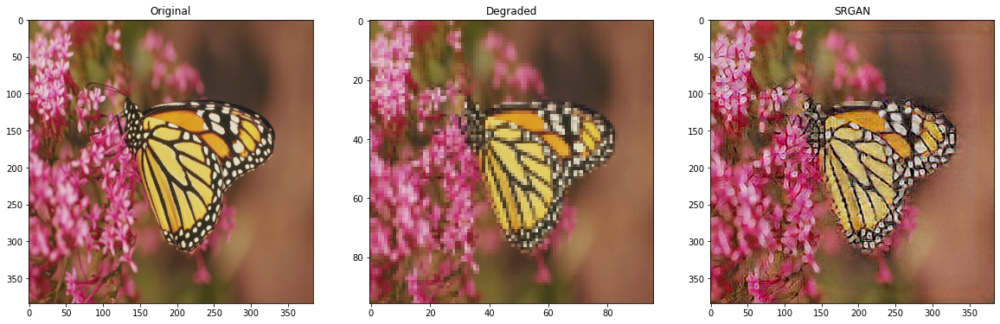

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 67.07454191498249
MSE: 0.03826021657787376
SSIM: 0.5917142629623413



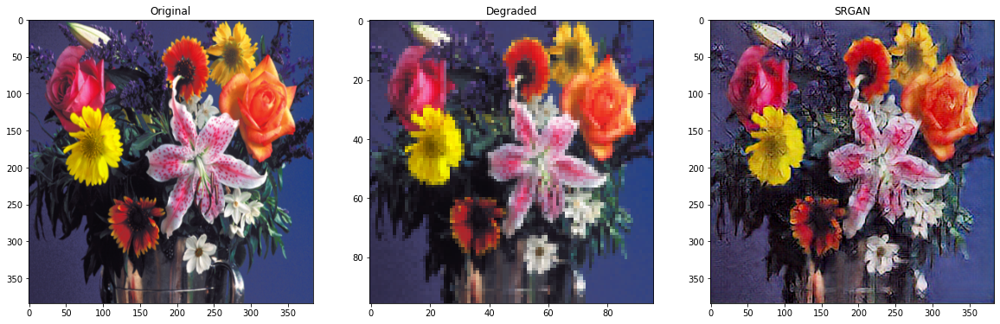

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 62.99586222371488
MSE: 0.0978622943000724
SSIM: 0.6770671010017395



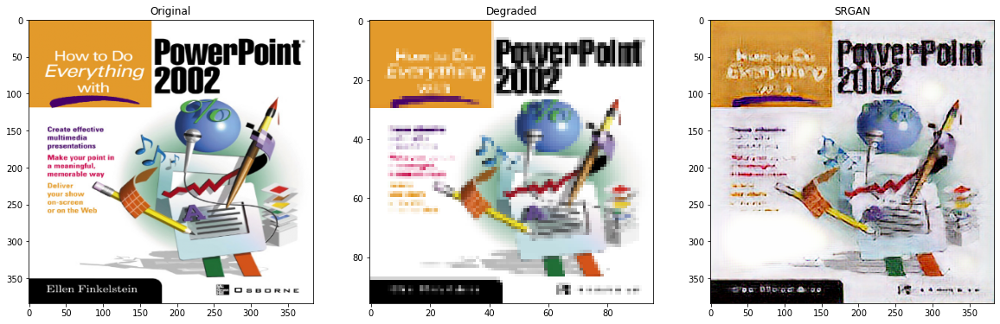

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 64.20325537241963
MSE: 0.074109874589793
SSIM: 0.5068100690841675



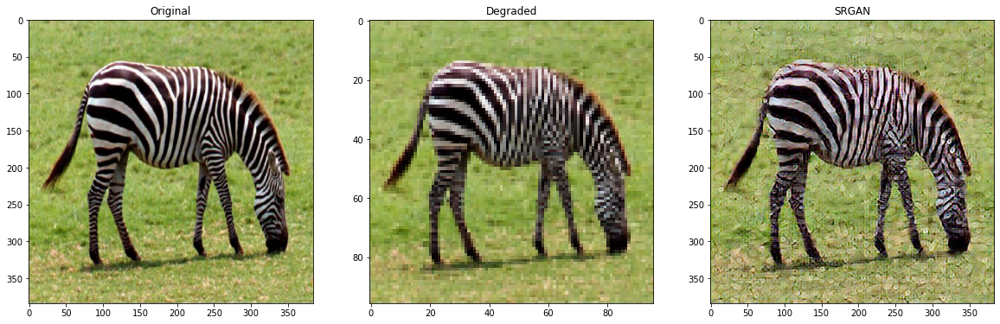

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 72.04432099663548
MSE: 0.012183428415682623
SSIM: 0.7524644732475281



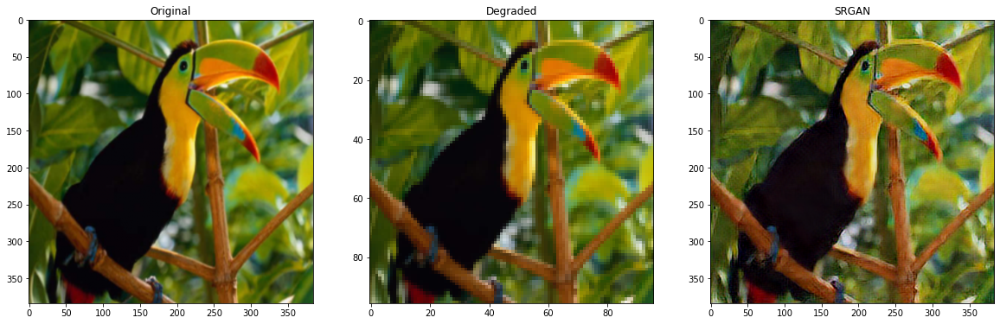

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 70.80093608834372
MSE: 0.016222134831570863
SSIM: 0.7512066960334778



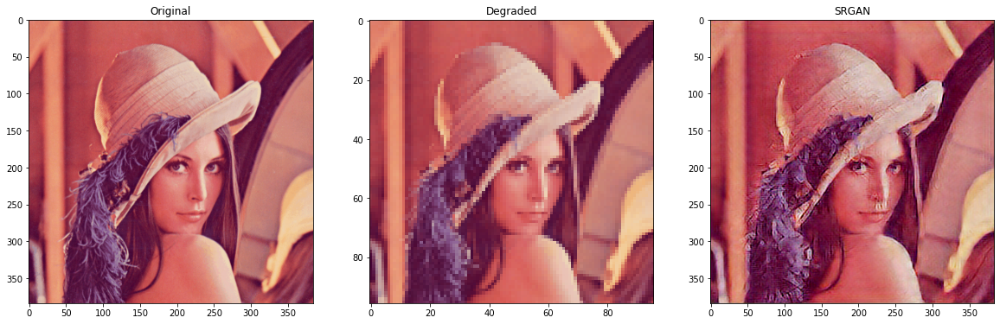

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 66.58407622850696
MSE: 0.04283452869324969
SSIM: 0.5725235342979431



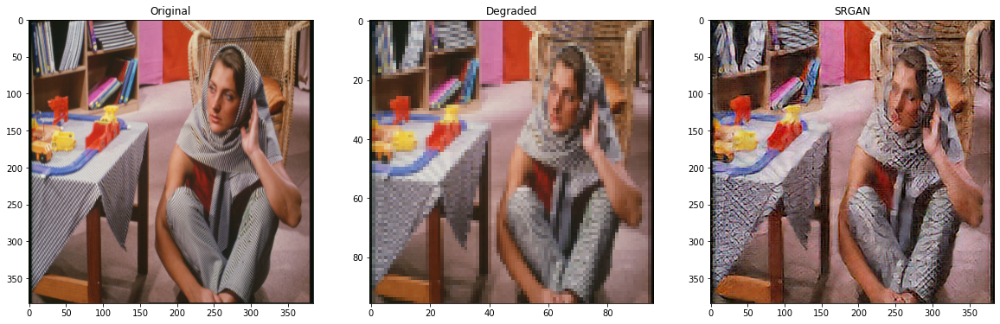

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 69.02244872562332
MSE: 0.024431871921297983
SSIM: 0.760681688785553



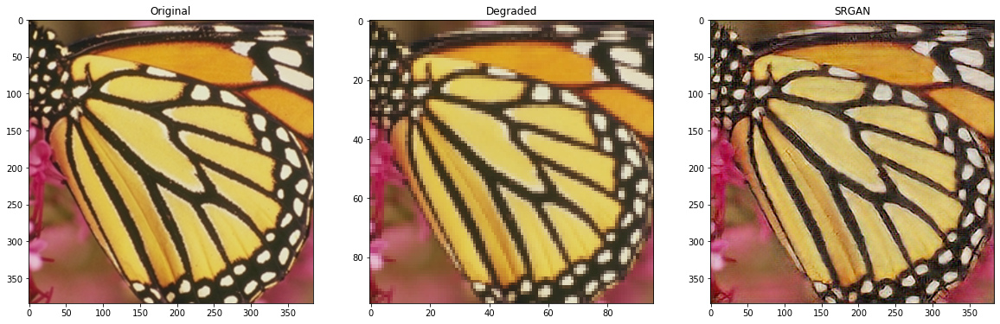

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 74.14199784910961
MSE: 0.007516260623323558
SSIM: 0.7531600594520569



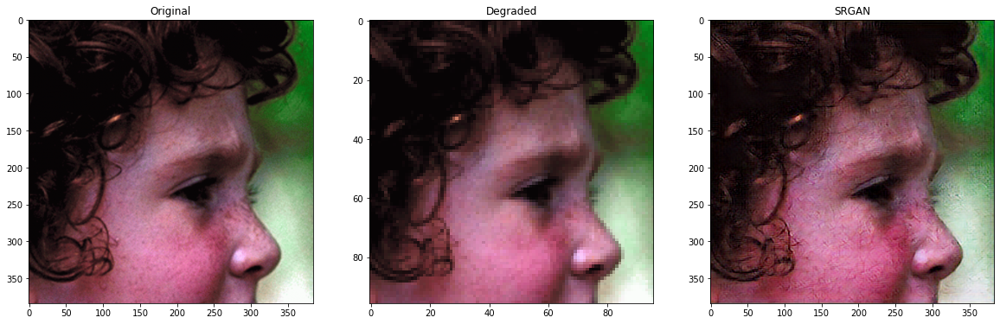

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 65.99152081823134
MSE: 0.04909638701909426
SSIM: 0.5877125859260559



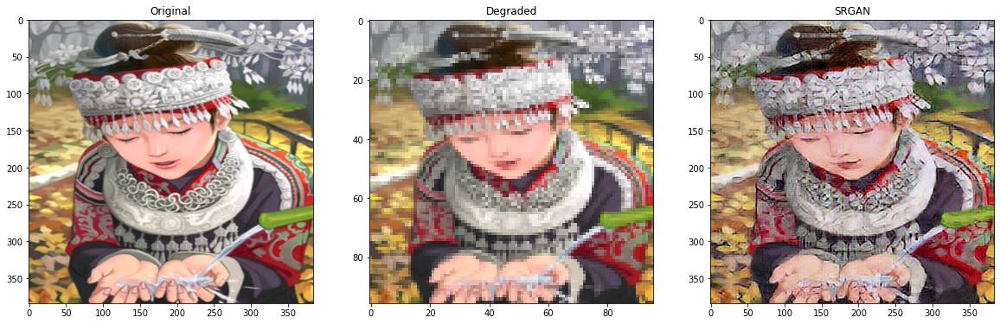

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 70.1051508363015
MSE: 0.019040858777196225
SSIM: 0.7387592196464539



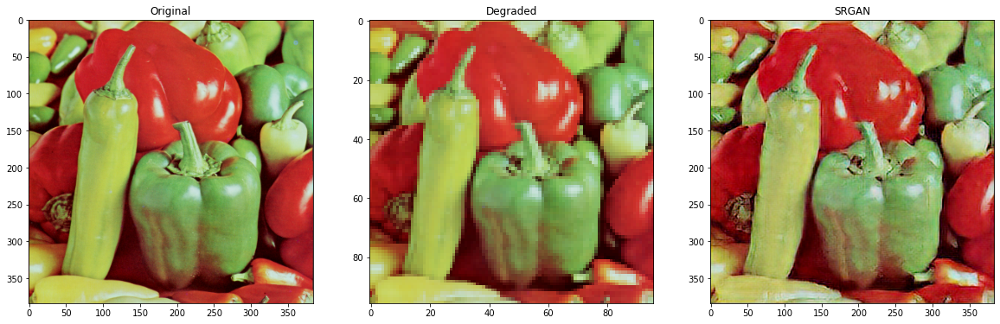

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 69.10585717242688
MSE: 0.023967122649483162
SSIM: 0.5514996647834778



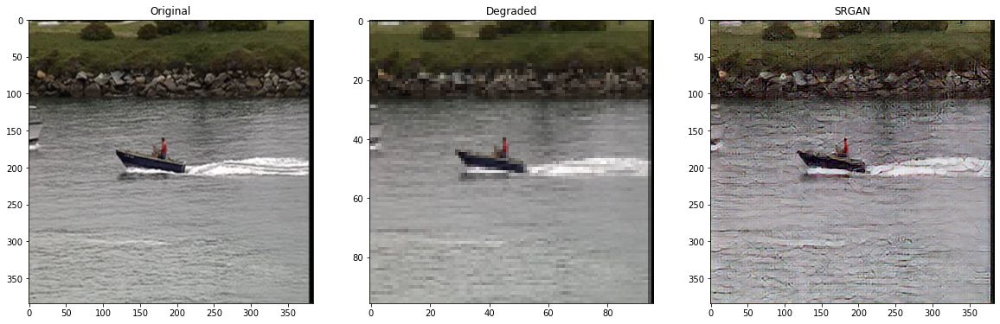

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 73.94227596780136
MSE: 0.007869987069495614
SSIM: 0.7439746260643005



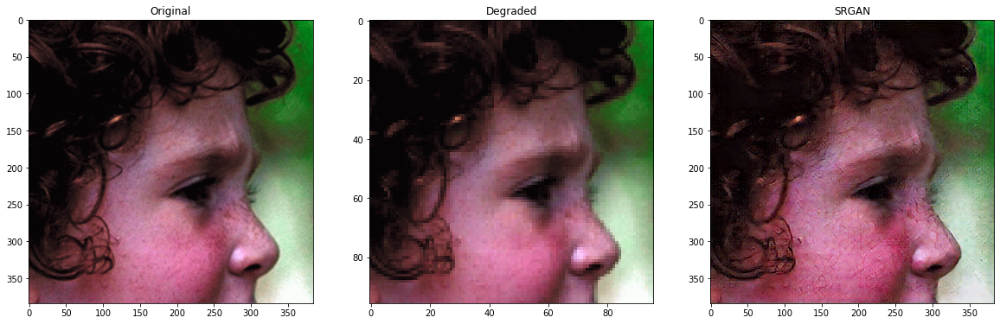

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 71.36818083946171
MSE: 0.01423585420722793
SSIM: 0.8665596842765808



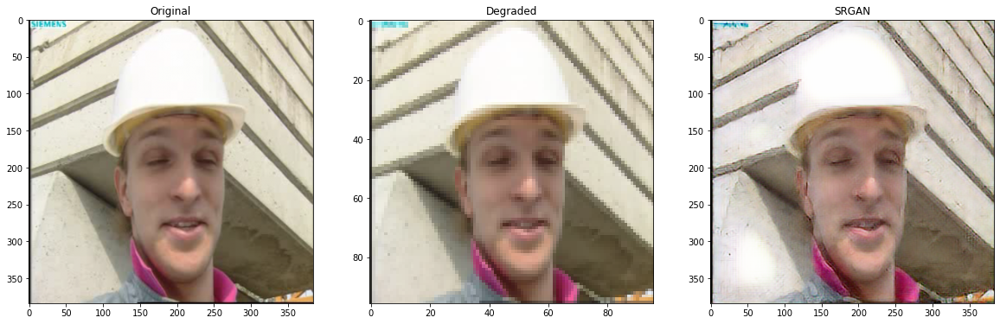

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 71.52000446545752
MSE: 0.013746785908292224
SSIM: 0.8362236618995667



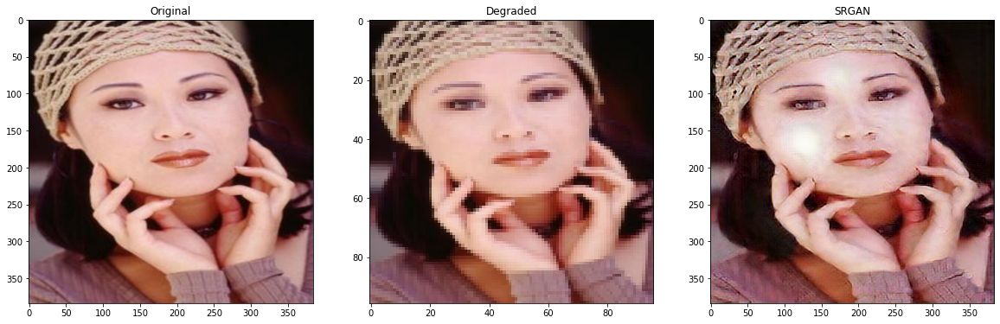

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 69.38623114212497
MSE: 0.022468728752575055
SSIM: 0.7505549788475037



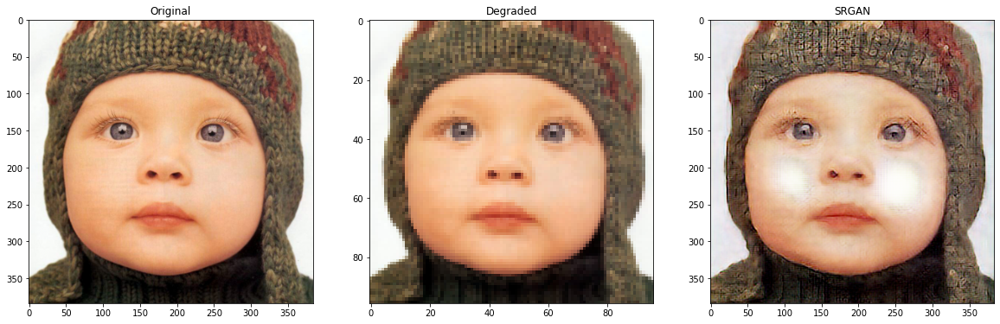

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reconstructed Image: 
PSNR: 64.46636807430826
MSE: 0.06975330793931317
SSIM: 0.38434863090515137



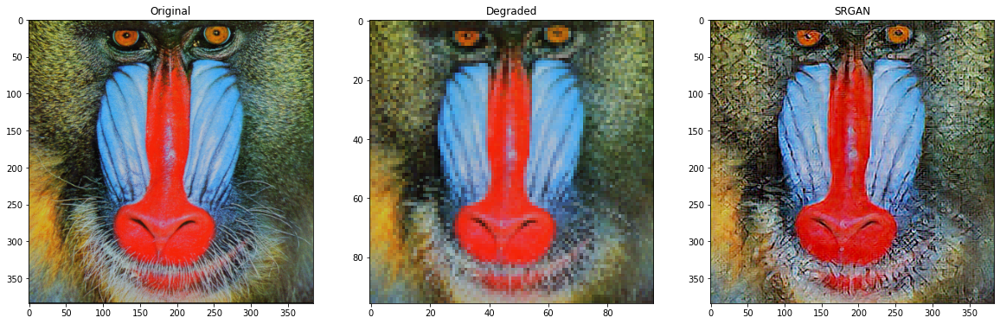

In [12]:
predict()